# Рынок общественного питания Москвы
Анализ выполняется по заказу фонда "Shut Up and Take My Money" на основе данных, собранных сервисами "Яндекс Карты" и "Яндекс Бизнес" в течение лета 2022 года.

В центре внимания - кофейни и их характеристики:
1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
2. Есть ли круглосуточные кофейни?
3. Какие у кофеен рейтинги? Как они распределяются по районам?
4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Анализ также дает общее преставление о рынке общепита, его структуре, территориальном распределении и стоимости услуг.


## Загрузка и обзор данных

In [1]:
# импортирование библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium import Marker, Map, Choropleth
import json
from folium.plugins import MarkerCluster

In [2]:
# открытие датасета
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# общий обзор данных
display(data.info())
data.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
# упорядочивание типов данных
# колонка chain с int на bool
data['chain'] = data['chain'].astype('bool')
# проверка изменения
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 862.1+ KB


Датасет содержит сведения о 8405 заведениях.

Пропуски встречаются в колонках, характеризующих цены, число посадочных мест и часы работы. В дальнейшем мы рассмотрим возможность заполнить эти пропуски.

Принято решение изменить тип данных в колонке chain, так как она содержит булево значение.

Тип данных в колонке seats может быть изменен на int, так как колонка описывает число посадочных мест, которое не может быть дробным. Однако колонка содержит пропуски, которые для целей изменения типа данных придется заменить нулями, что затрудняет восприятие. Принято решение оставить тип данных для этой колонки как есть.

## Предобработка данных

### Дубликаты

In [5]:
# проверка полных дубликатов
print(data.duplicated().sum())

0


In [6]:
# проверка неявных дубликатов по колонкам
# колонка name
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [7]:
# правка одного значения и проверка правки
data['category'] = data['category'].replace('бар,паб', 'бар, паб')
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар, паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
# колонка 'district'
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [9]:
# колонка 'price'
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [10]:
# проверка дубликатов в парах name + address
duplicates_name_check = data['name']
display(duplicates_name_check.duplicated().sum())
duplicates_name_check.head(10)

2792

0                  WoWфли
1          Четыре комнаты
2                   Хазри
3    Dormouse Coffee Shop
4               Иль Марко
5            Sergio Pizza
6             Огни города
7              Mr. Уголёк
8             Donna Maria
9                  Готика
Name: name, dtype: object

In [11]:
duplicates_address_check = data['address']
display(duplicates_address_check.duplicated().sum())
duplicates_address_check.head(10)

2653

0                 Москва, улица Дыбенко, 7/1
1         Москва, улица Дыбенко, 36, корп. 1
2             Москва, Клязьминская улица, 15
3        Москва, улица Маршала Федоренко, 12
4            Москва, Правобережная улица, 1Б
5               Москва, Ижорская улица, вл8Б
6      Москва, Клязьминская улица, 9, стр. 3
7      Москва, Клязьминская улица, 9, стр. 3
8    Москва, Дмитровское шоссе, 107, корп. 4
9                Москва, Ангарская улица, 39
Name: address, dtype: object

In [12]:
duplicates_check = data.drop(['district', 'hours', 'lat', 'lng', 'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'chain', 'seats'], axis='columns')
duplicates_check.head()

,name,category,address
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1"
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1"
2,Хазри,кафе,"Москва, Клязьминская улица, 15"
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12"
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б"


In [13]:
duplicates_check.duplicated().sum()

0

In [14]:
# проверка неявных дубликатов в колонке name по признаку сети True
chain_names = data.query('chain == True')
chain_names['name'].unique().tolist()

['Иль Марко',
 'Буханка',
 'Пекарня',
 'Чебуреки Манты',
 'Drive Café',
 'В парке вкуснее',
 'Кушай Город',
 'Додо Пицца',
 "Домино'с Пицца",
 'Крошка Картошка',
 'Кафетерий',
 '9 Bar Coffee',
 'CofeFest',
 'БлинБери',
 'Арамье',
 'Cofix',
 'Шашлык',
 "Coffeekaldi's",
 'Чебуречная история',
 'Pizza Hut',
 'Мимино',
 'Веранда',
 'Хинкали-Gали!',
 'Оазис',
 'Му-Му',
 'Coffee Way',
 'Дежене',
 'Халяль',
 'Гриль Хаус',
 'Zамания',
 'ЛавашОК',
 'Тбилисоба',
 'Take and Wake',
 'Pho Street',
 'Теремок',
 'Чайхана',
 'Bowl Family',
 'Островок Суши',
 'Сеть поминальных залов',
 'Алло! Пицца',
 'Встреча',
 'Шашлык Хаус',
 'Кулинария',
 'Арарат',
 'Калина',
 'Крепери',
 'Ho Chu Pho',
 'Хинкальная',
 'Шеф Бургер',
 'Парус',
 'One Price Coffee',
 'Скалка',
 'КофеТун-СушиТун',
 'Шоколадница',
 'Магбургер',
 'Бистро 24',
 'Яндекс Лавка',
 'Wild bean cafe',
 'Шаурма на углях',
 'Menza',
 'Булкер',
 'МосПлов',
 'Донер Кебаб',
 'СушиСтор',
 'ОШ',
 'Wild Bean',
 'Восточная кухня',
 'Тандыр № 1',
 'Еда Gr

In [15]:
def update_chain_name(chain_name_list):
    for row in chain_name_list:
        for elem in row:
            data['name'] = data['name'].replace(row[0], row[1])
chain_name_list = [
    ['Ача-чача', 'Ача-Чача'],
    ['Есть Хинкали&Пить Вино', 'Есть Хинкали & Пить Вино'],
    ['Правда кофе', 'Правда Кофе'],
    ['Хинкали - Gали!', 'Хинкали Gali!'],
    ['Хинкали-Gали!', 'Хинкали Gali!'],
    ['Хлеб насущный','Хлеб Насущный'],
    ['Чайхана халяль', 'Чайхана Халяль'],
    ['Чайхона № 1', 'Чайхона №1'],
    ['Черетто Море',  'Черетто'],
    ['Яндекс Лавка', 'Яндекс.Лавка'],
    ['BFL’S', 'Bfl’s'],
    ['Deli2go', 'Deli2Go'],
    ['French Bakery', 'French Bakery SeDelice'],
    ['SeDelice', 'French Bakery SeDelice'],
    ['PhoBo', 'Pho Bo'],
    ['Wild Bean', 'Wild Bean Cafe'],
    ['Кружка Паб', 'Кружкапаб'],
    ['Субботица сербская кухня', 'Ресторан сербской кухни Субботица'],
    ['Corner cafe&kitchen', 'Corner cafe & kitchen'],
    ['Korean chick', 'Korean Chick']


]
update_chain_name(chain_name_list)

In [16]:
# удаление 8 строк, в которых есть сомнения в истинности признака сети
data = data.drop([1280, 1654, 2686, 3142, 3401, 3739, 3915, 4041])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8398 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8398 non-null   object 
 1   category           8398 non-null   object 
 2   address            8398 non-null   object 
 3   district           8398 non-null   object 
 4   hours              7862 non-null   object 
 5   lat                8398 non-null   float64
 6   lng                8398 non-null   float64
 7   rating             8398 non-null   float64
 8   price              3309 non-null   object 
 9   avg_bill           3810 non-null   object 
 10  middle_avg_bill    3143 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8398 non-null   bool   
 13  seats              4793 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 926.7+ KB


Датасет не содержит полных дубликатов.

Колонки category, district, price проверены на неявные дубликаты.

Проверка колонок name и address на полные дубликаты показывает, что в датасете встречаются одинаковые названия заведений (2792) и одинаковые адреса (2653), что теоретически возможно, хотя сумма повторов и составляет 33% и 32%  от всех заведений, вошедших в датасет, соответственно.

При этом колонки name, category и address, выделенные в отдельную таблицу, не содержат полных дубликатов. Это означает, что в основном датасете нет случаев, когда одно и то же заведение имеет разные данные в остальных колонках в результате каких бы то ни было сбоев. Таким образом, мы можем считать, что повторяющиеся названия и адреса не являются ошибками, требующими дополнительного исследования.

В колонке name проверены и исправлены неявные дубликаты для тех заведений, что имеют отметку chain == True, так как в исследовании перед нами среди прочего стоит задача рассмотреть сети. В ходе проверки и правки обнаружены 8 случаев ошибок в колонке chain - когда, являясь сетевым, заведение имеет отметку chain == False. Эти строки удалены.

Не представляется возможным проверить колонку address на неявные дубликаты.

### Пропуски

In [17]:
# общая оценка ситуации с пропусками
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


In [18]:
# замена пропусков в колонке hours
data['hours'] = data['hours'].fillna('неизвестно')

In [19]:
# замена пропусков в графе middle_avg_bill медианным значением по районам
for district in data['district']:
    data.loc[(data['district'] == district) & (data['middle_avg_bill'].isna()),'middle_avg_bill'] = data.loc[(data['district'] == district), 'middle_avg_bill'].median()
display(data['middle_avg_bill'].isna().sum())

0

In [20]:
# замена пропусков в графе middle_coffee_cup медианным значением по районам
for district in data['district']:
    data.loc[(data['district'] == district) & (data['middle_coffee_cup'].isna()),'middle_coffee_cup'] = data.loc[(data['district'] == district), 'middle_coffee_cup'].median()
display(data['middle_coffee_cup'].isna().sum())

0

In [21]:
# замена пропусков в графе seats медианным значением по категориям
for category in data['category'].unique():
    data.loc[(data['category'] == category) & (data['seats'].isna()),'seats'] = data.loc[(data['category'] == category), 'seats'].median()
display(data['seats'].isna().sum())

0

In [22]:
# проверка возможности заполнить графу price
filling_price = data.pivot_table(index = 'price', values = 'middle_avg_bill', aggfunc = ['min', 'max']).reset_index()
filling_price

,price,min,max
,,middle_avg_bill,middle_avg_bill
0,высокие,0.0,35000.0
1,выше среднего,375.0,4500.0
2,низкие,90.0,1000.0
3,средние,165.0,2150.0


In [23]:
# проверка заполнения
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,0.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


1. Для упрощения работы с данными мы заменили пропуски в колонке hours на значение "неизвестно".
2. Пропуски в графе middle_avg_bill заполнены медианными значениями для данного района.
3. Пропуски в графе middle_coffee_cup заполнены медианными значениями для данного района.
3. Пропуски в графе seats заполнены медианными значениями для данной категории.
4. Не представляется возможным заполнить пропуски в графе avg_bill, так как данные в этой графе неединообразны.
5. Не представляется возможным заполнить пропуски в графе price, так как диапазоны минимальных и максимальных средних чеков пересекаются для разных ценовых категорий.


### Дополнительные столбцы

In [24]:
# вывод названия улицы в отдельную колонку street
split_address = data['address'].str.split(', ', expand=True)
display(split_address[1].head(10))
data['street'] = split_address[1]
data.head(10)

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
5             Ижорская улица
6         Клязьминская улица
7         Клязьминская улица
8          Дмитровское шоссе
9            Ангарская улица
Name: 1, dtype: object

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,650.0,159.0,False,60.0,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,159.0,False,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,159.0,False,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,650.0,170.0,False,80.0,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,159.0,True,148.0,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,650.0,159.0,False,55.0,Ижорская улица
6,Огни города,"бар, паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,159.0,False,45.0,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,159.0,False,45.0,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,159.0,False,79.0,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,159.0,False,65.0,Ангарская улица


In [25]:
# исправление значения для улицы Шкулева
data['street'] = data['street'].replace('улица Шкулёва 4', 'улица Шкулёва')

In [26]:
# колонка 24/7 для отметки круглосуточного режима работы без выходных
def clock(hours):
    if hours == "ежедневно, круглосуточно":
        return 'True'
    return 'False'
data['is_24/7'] = data['hours'].apply(clock)
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,650.0,159.0,False,60.0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,159.0,False,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,159.0,False,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,650.0,170.0,False,80.0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,159.0,True,148.0,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,650.0,159.0,False,55.0,Ижорская улица,False
6,Огни города,"бар, паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,159.0,False,45.0,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,159.0,False,45.0,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,159.0,False,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,159.0,False,65.0,Ангарская улица,False


## Анализ данных

### Распределение заведений по категориям

In [27]:
# распределение заведений по категориям
objects_category = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count').reset_index().sort_values(by = 'name', ascending = False)
display(objects_category)
fig = px.bar(objects_category, x='category', y='name', title = "Число заведений в каждой категории").update_layout(
    xaxis_title="Категория", yaxis_title="Число заведений")
fig.update_xaxes(tickangle = 45)
fig.show()

,category,name
3,кафе,2378
6,ресторан,2035
4,кофейня,1413
0,"бар, паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Больше всего заведений относятся к категории "кафе" и "ресторан", за ними следуют кофейни. Меньше всего - столовых и булочных. Между этими двумя группами находятся бары/пабы, пиццерии и заведения быстрого питания.

### Медианное число посадочных мест в заведениях по категориям

In [28]:
# число посадочных мест в заведениях по категориям
seats_category = data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').reset_index().sort_values(by = 'seats', ascending = False)
display(seats_category)
fig = px.bar(seats_category, x='category', y='seats', title = "Медиана числа посадочных мест в заведениях каждой категории").update_layout(
    xaxis_title="Категория", yaxis_title="Посадочные места")
fig.update_xaxes(tickangle = 45)
fig.show()

,category,seats
6,ресторан,86.0
0,"бар, паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Самое большое число посадочных мест - в ресторане, что логично, так как заведения этого типа обычно довольно большие. На втором месте можно было бы ожидать столовую, однако ее опередили бар/паб и кофейня. Булочная на последнем месте, и это тоже представляется закономерным, так как речь идет скорее о магазине хлебобулочных изделий, где установлены 2-3 столика, но медианное число мест - 50 - выглядит удивительно.

Рассмотрим данные о числе посадочных мест подробнее на примере булочных.

In [29]:
# проверка медианного числа посадочных мест в булочных
bakery_places_seats = data.query('category == "булочная"').pivot_table(index = 'name', values = 'seats', aggfunc = 'median').reset_index().sort_values(by = 'seats')
display(bakery_places_seats)
bakery_places_seats['seats'].median()


,name,seats
22,Бико,0.0
104,Сладко,0.0
127,Чайхана Семетей,0.0
128,Четыре Пекаря,0.0
78,Пекарня 24,0.0
...,...,...
135,Шеф Concept,273.0
124,Хлебо mania,276.0
119,Хлеб да Выпечка,276.0
88,Печорин,290.0


50.0

In [30]:
# вывод сведений о булочной с самым большим медианным числом посадочных мест
data.query('name == "Remy Kitchen Bakery"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3658,Remy Kitchen Bakery,булочная,"Москва, Тверской бульвар, 7",Центральный административный округ,"ежедневно, 08:00–00:00",55.758928,37.598745,4.5,высокие,NaN,1000.0,190.0,True,50.0,Тверской бульвар,False
4113,Remy Kitchen Bakery,булочная,"Москва, Пресненская набережная, 8, стр. 1",Центральный административный округ,"ежедневно, 08:00–00:00",55.746841,37.538648,4.4,средние,Средний счёт:500–1500 ₽,1000.0,190.0,True,478.0,Пресненская набережная,False


In [31]:
# изучение границ нормальных значений для всех булочных
bakery_anomaly_overview = data.query('category == "булочная"').describe()
bakery_anomaly_overview = bakery_anomaly_overview.T
bakery_anomaly_overview['bottom_whisker'] = bakery_anomaly_overview['25%'] - 1.5 * (bakery_anomaly_overview['75%'] - bakery_anomaly_overview['25%'])
bakery_anomaly_overview['upper_whisker'] = bakery_anomaly_overview['75%'] + 1.5 * (bakery_anomaly_overview['75%'] - bakery_anomaly_overview['25%'])
bakery_anomaly_overview

,count,mean,std,min,25%,50%,75%,max,bottom_whisker,upper_whisker
lat,256.0,55.756431,0.071731,55.579437,55.710408,55.752161,55.803577,55.897609,55.570654,55.943331
lng,256.0,37.592431,0.102499,37.400747,37.517901,37.589340,37.654618,37.873787,37.312825,37.859693
rating,256.0,4.268359,0.386303,1.300000,4.200000,4.300000,4.400000,5.000000,3.900000,4.700000
middle_avg_bill,256.0,704.746094,329.236541,50.000000,500.000000,650.000000,1000.000000,2500.000000,-250.000000,1750.000000
middle_coffee_cup,256.0,169.087891,20.817910,135.000000,150.000000,162.500000,190.000000,197.000000,90.000000,250.000000
seats,256.0,72.769531,76.686359,0.000000,44.750000,50.000000,70.500000,625.000000,6.125000,109.125000


In [32]:
# вывод сведений о булочных, чье число посадочных мест выходит за пределы правого уса
data.query('category == "булочная" and seats > 262')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
923,Paul,булочная,"Москва, проспект Мира, 211, корп. 2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.845540,37.666077,4.4,средние,Средний счёт:800–1000 ₽,900.0,162.5,True,273.0,проспект Мира,False
1295,Пурмарили,булочная,"Москва, Волоколамское шоссе, 1, стр. 1",Северный административный округ,"ежедневно, круглосуточно",55.806408,37.505566,4.3,средние,Средний счёт:800 ₽,800.0,159.0,False,320.0,Волоколамское шоссе,True
1826,Волконский,булочная,"Москва, Ленинградский проспект, 29, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.785088,37.562647,4.4,NaN,NaN,650.0,159.0,True,625.0,Ленинградский проспект,False
2251,Шеф Concept,булочная,"Москва, проспект Мира, 101, стр. 2",Северо-Восточный административный округ,пн-пт 08:30–18:00,55.811640,37.635626,4.3,средние,Средний счёт:220–350 ₽,285.0,162.5,False,273.0,проспект Мира,False
3067,Штолле,булочная,"Москва, Осенний бульвар, 16, корп. 1",Западный административный округ,"ежедневно, 08:00–21:00",55.760474,37.408507,4.2,NaN,NaN,1000.0,187.0,True,300.0,Осенний бульвар,False
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,1000.0,187.0,True,276.0,Ярцевская улица,False
3124,Хлебо mania,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738500,37.410805,4.5,NaN,NaN,1000.0,187.0,False,276.0,Ярцевская улица,False
3911,Хлеб Насущный,булочная,"Москва, площадь Киевского Вокзала, 2",Западный административный округ,пн-чт 07:00–22:00; пт 07:00–23:00; сб 08:00–23...,55.744540,37.567481,4.4,NaN,NaN,1000.0,187.0,True,300.0,площадь Киевского Вокзала,False
4113,Remy Kitchen Bakery,булочная,"Москва, Пресненская набережная, 8, стр. 1",Центральный административный округ,"ежедневно, 08:00–00:00",55.746841,37.538648,4.4,средние,Средний счёт:500–1500 ₽,1000.0,190.0,True,478.0,Пресненская набережная,False
6227,Хлеб с маслом,булочная,"Москва, улица Вавилова, 3",Южный административный округ,"ежедневно, 09:00–22:00",55.706515,37.591478,4.8,NaN,NaN,500.0,149.5,True,320.0,улица Вавилова,False


Похоже, что большое число посадочных мест свойственно тем заведениям, которые расположены в крупных торговых центрах или вблизи рынков, и рассчитывается оно не по числу столиков, а по некому параметру, похожему на проходимость. То есть в нашем датасете значения колонки seats могут быть рассчитаны разными способами - по реальному числу столов и по проходимости. Это означает, что, имея в руках только текущие сведения, мы не можем предложить адекватный способ заполнить пропуски в колонке seats.

### Соотношение сетевых и несетевых заведений

In [33]:
# соотношение сетевых и несетевых заведений
chain_status_ratio = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').reset_index()
chain_status_ratio['percentage'] = chain_status_ratio['name'] / data['name'].count() * 100
display(chain_status_ratio)
fig = px.pie(chain_status_ratio, names = ['Несетевое', 'Сетевое'], values = chain_status_ratio['percentage'], title = "Соотношение сетевых и несетевых заведений с , %")
fig.show()

,chain,name,percentage
0,False,5193,61.836151
1,True,3205,38.163849


Несетевых заведений примерно в полтора раза больше, чем сетевых.

###   Число сетевых заведений в каждой категории

In [34]:
# число сетевых заведений в каждой категории
category_chain_frequency = data.pivot_table(index = 'category', values = 'chain', aggfunc = 'sum').sort_values(by = 'chain', ascending = False).reset_index()
category_chain_frequency['percentage'] = category_chain_frequency['chain'] / category_chain_frequency['chain'].sum()* 100
display(category_chain_frequency)
fig = px.bar(category_chain_frequency, x='category', y='chain', title = "Число сетевых заведений в каждой категории").update_layout(
    xaxis_title="Категория", yaxis_title="Число заведений")
fig.update_xaxes(tickangle = 45)
fig.show()

,category,chain,percentage
0,кафе,779,24.305772
1,ресторан,730,22.776911
2,кофейня,720,22.464899
3,пиццерия,330,10.296412
4,быстрое питание,232,7.238690
5,"бар, паб",169,5.273011
6,булочная,157,4.898596
7,столовая,88,2.745710


In [35]:
fig = px.pie(category_chain_frequency, names = category_chain_frequency['category'], values = category_chain_frequency['percentage'], title = "Доли категорий среди сетей, %")
fig.show()

В тройке лидеров - кафе, ресторан и кофейня, при этом преимущество категории "кафе" перед почти равными категориями "ресторан" и "кофейня" совсем небольшое. На четвертом месте пиццерии с большим отставанием от кофеен и дальше число сетевых заведений продолжает плавно снижаться.

### Топ-15 популярных сетей в Москве

In [36]:
# топ-15 популярных сетей в Москве
chain_top_15 = data.query('chain == True').pivot_table(index = ['name', 'category'], values = 'address', aggfunc = 'count').sort_values(by = 'address', ascending = False).reset_index().head(15)
display(chain_top_15)
# график топ15 популярных сетей в Москве
fig = px.bar(chain_top_15, x='name', y='address', title = "Топ-15 популярных сетей в Москве по числу заведений").update_layout(
    xaxis_title="Название сети", yaxis_title="Число заведений")
fig.update_xaxes(tickangle = 45)
fig.show()
# распределение заведений из топ-15 по райтонам
top_15_district_count = data.query('chain == True').pivot_table(index = 'name', columns = 'district', values = 'address', aggfunc = 'count')
# объединение данных топ-15 и распределения сетевых заведений по районам
top_15_final = chain_top_15.merge(top_15_district_count, on='name', how='inner')
display(top_15_final)
# медианное число заведений в топ-15
top_15_final['address'].median()

,name,category,address
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,Яндекс.Лавка,ресторан,72
4,One Price Coffee,кофейня,71
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


,name,category,address,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
0,Шоколадница,кофейня,119,12.0,17.0,14.0,11.0,7.0,38.0,2.0,7.0,12.0
1,Домино'с Пицца,пиццерия,76,9.0,9.0,10.0,9.0,7.0,3.0,10.0,8.0,11.0
2,Додо Пицца,пиццерия,74,11.0,6.0,10.0,10.0,6.0,5.0,6.0,8.0,12.0
3,Яндекс.Лавка,ресторан,72,12.0,10.0,4.0,7.0,3.0,5.0,8.0,11.0,12.0
4,One Price Coffee,кофейня,71,6.0,9.0,8.0,7.0,4.0,15.0,6.0,7.0,9.0
5,Cofix,кофейня,65,6.0,4.0,10.0,6.0,4.0,20.0,4.0,2.0,9.0
6,Prime,ресторан,49,1.0,3.0,3.0,1.0,1.0,37.0,NaN,2.0,2.0
7,КОФЕПОРТ,кофейня,42,1.0,7.0,4.0,7.0,4.0,15.0,NaN,3.0,1.0
8,Кулинарная лавка братьев Караваевых,кафе,39,1.0,1.0,3.0,1.0,NaN,32.0,NaN,1.0,NaN
9,Теремок,ресторан,36,1.0,2.0,4.0,6.0,2.0,7.0,3.0,3.0,10.0


42.0

In [37]:
# численность заведений из топ-15 по катеогриям и по районам
category_by_district = top_15_final.groupby('category').sum().sort_values(by = 'address', ascending = False).reset_index()
category_by_district.insert(loc = 2, column = 'percentage', value = category_by_district['address'] / category_by_district['address'].sum() * 100)
category_by_district

,category,address,percentage,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
0,кофейня,350,45.395590,29.0,44.0,43.0,35.0,20.0,108.0,15.0,25.0,34.0
1,ресторан,157,20.363165,14.0,15.0,11.0,14.0,6.0,49.0,11.0,16.0,24.0
2,пиццерия,150,19.455253,20.0,15.0,20.0,19.0,13.0,8.0,16.0,16.0,23.0
3,кафе,89,11.543450,3.0,15.0,9.0,6.0,3.0,36.0,11.0,10.0,7.0
4,булочная,25,3.242542,2.0,7.0,9.0,8.0,3.0,1.0,0.0,2.0,0.0


In [38]:
fig = px.pie(category_by_district, names = category_by_district['category'], values = category_by_district['percentage'], title = "Доли категорий в топ 15 сетей, %")
fig.show()

С большим отрывом в топе пятнадцати самых популярных сетей лидирует "Шоколадница". Замыкает рейтинг ее коллега по категории "Кофемания". На медиане расположен "КОФЕПОРТ", а его ближайшие соседи - "Кулинарная лавка братьев Караваевых" и "Prime".

Самая многочисленная категория в рейтинге топ-15 - кофейня, их 350, и почти треть - в Центральном округе. Меньше всего булочных - 25, и все они относятся к сети "Буханка".

### Число заведений каждой категории по районам

In [39]:
# распределение заведений определенной категории по районам
districts = data.pivot_table(index = 'district', columns = 'category', values = 'address', aggfunc = 'count').reset_index()
districts['всего'] = districts.sum(axis=1)
districts

category,district,"бар, паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
0,Восточный административный округ,53,25,71,272,105,72,159,40,797
1,Западный административный округ,50,37,62,239,150,71,216,24,849
2,Северный административный округ,68,39,58,235,193,77,188,41,899
3,Северо-Восточный административный округ,63,28,82,269,159,68,181,40,890
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
5,Центральный административный округ,364,50,87,464,428,113,667,66,2239
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
8,Южный административный округ,68,25,85,264,131,73,202,44,892


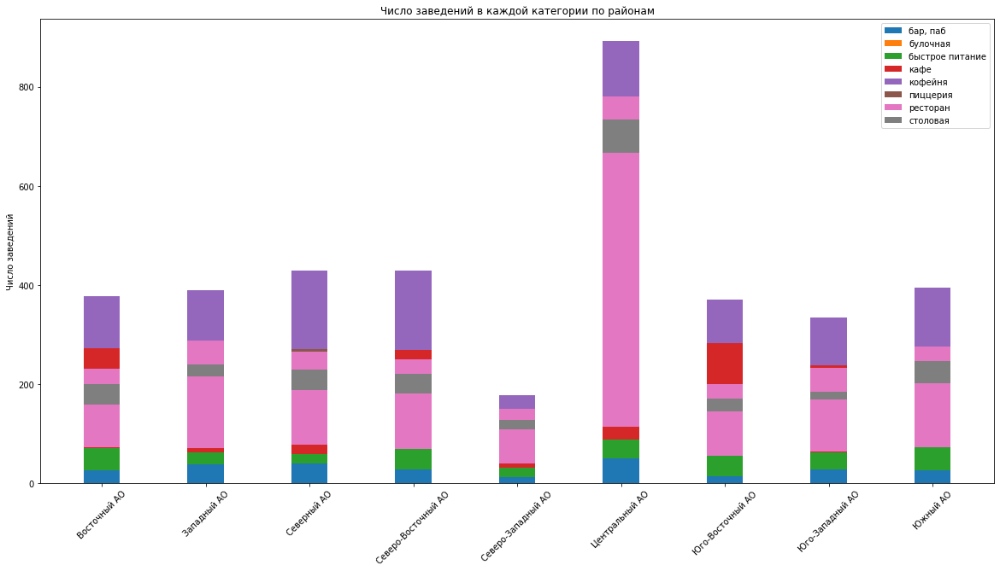

In [40]:
# график распределения заведений определенной категории по районам
labels = ['Восточный АО', 'Западный АО', 'Северный АО', 'Северо-Восточный АО', 'Северо-Западный АО', 'Центральный АО', 'Юго-Восточный АО','Юго-Западный АО', 'Южный АО']
bar_pub = districts['бар, паб']
bakery = districts['булочная']
fast_food = districts['быстрое питание']
cafe = districts['кафе']
coffee_house = districts['кофейня']
pizza = districts['пиццерия']
restaurant = districts['ресторан']
canteen = districts['столовая']

width = 0.35

fig, ax = plt.subplots(figsize=(20, 10))

ax.bar(labels, bar_pub, width, label='бар, паб')
ax.bar(labels, bakery, width, bottom=bar_pub, label='булочная')
ax.bar(labels, fast_food, width, bottom=bakery, label='быстрое питание')
ax.bar(labels, cafe, width, bottom=fast_food, label='кафе')
ax.bar(labels, coffee_house, width, bottom=cafe, label='кофейня')
ax.bar(labels, pizza, width, bottom=coffee_house, label='пиццерия')
ax.bar(labels, restaurant, width, bottom=pizza, label='ресторан')
ax.bar(labels, canteen, width, bottom=restaurant, label='столовая')

ax.set_ylabel('Число заведений')
ax.set_title('Число заведений в каждой категории по районам')
ax.tick_params(axis='x', rotation=45)
ax.legend()

plt.show()

Больше всего заведений - вполне ожидаемо - в центральной части города, свыше 2000. Меньше всего - в Северо-Западном округе, в 5 раз меньше. Численность заведений общепита в других округах колеблется не слишком широко: между ~ 700 и ~ 900 заведениями.

### Средний рейтинг заведений по категориям

In [41]:
# средний рейтинг заведений по категориям
mean_rating_category = data.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean').sort_values(by = 'rating', ascending = False).reset_index()
display(mean_rating_category)

,category,rating
0,"бар, паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.289582
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


In [42]:
# график среднего рейтинга заведений по категориям
fig = px.bar(mean_rating_category, x='category', y='rating', title = "Средний рейтинг заведений по категориям").update_layout(
    xaxis_title="Категория", yaxis_title="Средний рейтинг")
fig.update_xaxes(tickangle = 45)
fig.show()

Средний рейтинг заведений в разных категориях колеблется на 0,4 балла - в диапазоне от 4 до 4,4 баллов.

### Средний рейтинг заведений в каждом районе

In [43]:
# средний рейтинг заведений в каждом районе
mean_rating_district = data.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').sort_values(by = 'rating', ascending = False).reset_index()
mean_rating_district['lat'] = [55.753600, 55.838390, 55.829370, 55.622014, 55.728003, 55.787715, 55.662735, 55.854875, 55.662735]
mean_rating_district['lng'] = [37.621184, 37.525774, 37.451555, 37.678065, 37.443533, 37.775631, 37.576187, 37.576187, 37.754592]
mean_rating_district

,district,rating,lat,lng
0,Центральный административный округ,4.377222,55.753600,37.621184
1,Северный административный округ,4.239266,55.838390,37.525774
2,Северо-Западный административный округ,4.208802,55.829370,37.451555
3,Южный административный округ,4.184417,55.622014,37.678065
4,Западный административный округ,4.180919,55.728003,37.443533
5,Восточный административный округ,4.174279,55.787715,37.775631
6,Юго-Западный административный округ,4.172920,55.662735,37.576187
7,Северо-Восточный административный округ,4.147978,55.854875,37.576187
8,Юго-Восточный административный округ,4.101120,55.662735,37.754592


In [44]:
# хороплет со средним рейтингом заведений каждого района
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=mean_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
def mean_rating_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['district']} {row['rating']}"
    ).add_to(m)
mean_rating_district.apply(mean_rating_marker, axis = 1)
m

### Все заведения на карте

In [45]:
# карта, содержащая все доступные заведения
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)
data.apply(create_clusters, axis=1)
m

### Топ-15 улиц по числу заведений

In [46]:
# топ-15 улиц по количеству заведений
streets_top_15 = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).head(15).reset_index()
display(streets_top_15)
display('Сумма заведений на топ-15 улиц:', streets_top_15['name'].sum(),
       'Медианное число заведений:', streets_top_15['name'].median())
fig = px.bar(streets_top_15, x='street', y='name', title = "Число заведений на топ-15 улицах").update_layout(
    xaxis_title="Улица", yaxis_title="Число заведений")
fig.update_xaxes(tickangle = 45)
fig.show()

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


'Сумма заведений на топ-15 улиц:'

1258

'Медианное число заведений:'

76.0

In [47]:
# все заведения, расположенные на топ-15 улиц
streets_name = data.query('street in @streets_top_15["street"]')
streets_name

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,159.0,False,79.0,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,159.0,False,60.0,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,159.0,False,96.0,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,159.0,False,55.0,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,159.0,False,60.0,МКАД,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,450.0,145.0,False,80.0,Люблинская улица,False
8396,Пекинский Двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,187.0,False,200.0,Ленинский проспект,False
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,600.0,197.0,False,86.0,Профсоюзная улица,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,145.0,False,150.0,Люблинская улица,True


In [48]:
# численность категорий, представленные на топ-15 улиц
streets_name_category_count = streets_name.pivot_table(index='street', columns = 'category', values = 'name', aggfunc = 'count').reset_index()
streets_name_category_count

category,street,"бар, паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
1,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
2,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
3,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
6,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
7,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
8,МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0
9,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0


In [49]:
# объединение данных топ-15 улиц и распределения категорий по улицам
top_15_streets_final = streets_top_15.merge(streets_name_category_count, on = 'street', how = 'inner')
top_15_streets_final

,street,name,"бар, паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,184,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,122,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,108,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,107,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,95,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,88,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,77,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,76,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,70,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,МКАД,65,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


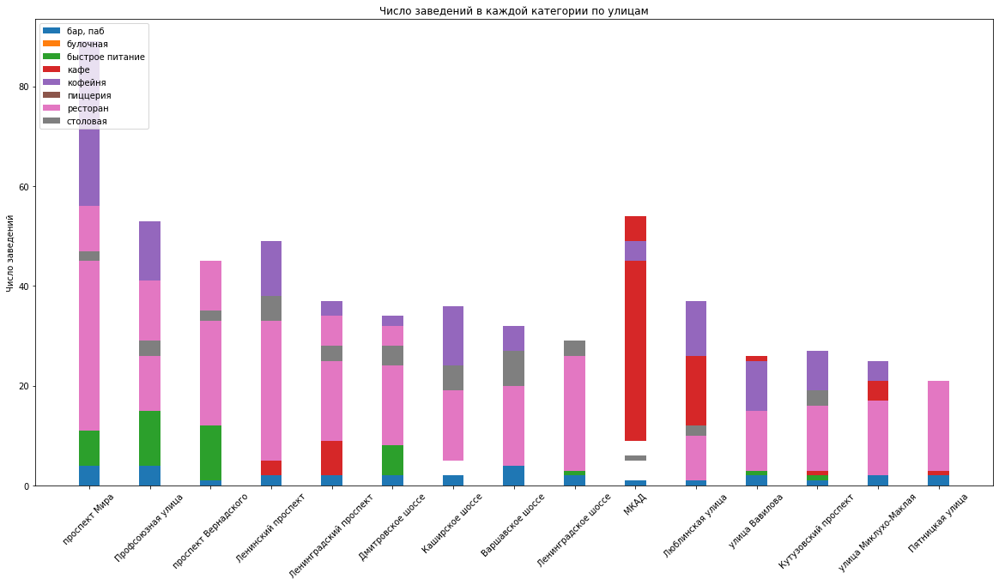

In [50]:
# график распределения заведений определенной категории по топ-15 улиц
labels = top_15_streets_final['street']
bar_pub = top_15_streets_final['бар, паб']
bakery = top_15_streets_final['булочная']
fast_food = top_15_streets_final['быстрое питание']
cafe = top_15_streets_final['кафе']
coffee_house = top_15_streets_final['кофейня']
pizza = top_15_streets_final['пиццерия']
restaurant = top_15_streets_final['ресторан']
canteen = top_15_streets_final['столовая']

width = 0.35

fig, ax = plt.subplots(figsize=(20, 10))

ax.bar(labels, bar_pub, width, label='бар, паб')
ax.bar(labels, bakery, width, bottom=bar_pub, label='булочная')
ax.bar(labels, fast_food, width, bottom=bakery, label='быстрое питание')
ax.bar(labels, cafe, width, bottom=fast_food, label='кафе')
ax.bar(labels, coffee_house, width, bottom=cafe, label='кофейня')
ax.bar(labels, pizza, width, bottom=coffee_house, label='пиццерия')
ax.bar(labels, restaurant, width, bottom=pizza, label='ресторан')
ax.bar(labels, canteen, width, bottom=restaurant, label='столовая')

ax.set_ylabel('Число заведений')
ax.set_title('Число заведений в каждой категории по улицам')
ax.tick_params(axis='x', rotation=45)
ax.legend()

plt.show()

Больше всего заведений расположено на проспекте Мира, а меньше всего - на улице Пятницкой. На медиане располжено Варшавское шоссе, а его соседи - Каширское и Ленинградское шоссе.

С точки зрения распределения категорий по топ-15 улиц, не везде присутствует полный набор категорий, например, на кольцевой дороге нет пиццерий и булочных, а на Пятницкой - столовых.

### Улицы, на которых расположен только один объект общепита

In [51]:
# определение улиц, на которых расположен только один объект общепита
single_object = data.pivot_table(index = ['street'], values = 'name', aggfunc = 'count').reset_index()
single_object_final = single_object.query('name == 1')
single_object_final

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1431,улица Чечулина,1
1432,улица Чистова,1
1437,улица Шухова,1
1440,улица Юннатов,1


In [52]:
# подготовка таблицы для построения карты
single_object_map = single_object_final.merge(data, on = 'street', how = 'inner')

In [53]:
# обзор таблицы для построения карты
display(single_object_map.head())
display('Средний рейтинг:', single_object_map['rating'].median())
pd.DataFrame(round(single_object_map.isna().mean()*100,)).style.background_gradient('coolwarm')

,street,name_x,name_y,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,149.5,True,20.0,True
1,1-й Балтийский переулок,1,Хуан Хэ,ресторан,"Москва, 1-й Балтийский переулок, 3/25",Северный административный округ,"ежедневно, 12:00–22:00",55.810418,37.518824,4.4,высокие,Средний счёт:1500–2000 ₽,1750.0,159.0,False,60.0,False
2,1-й Варшавский проезд,1,Колизей,кафе,"Москва, 1-й Варшавский проезд, 1Ас9",Южный административный округ,пн-чт 10:00–00:00; пт-вс 10:00–05:00,55.648674,37.627979,4.0,NaN,NaN,500.0,149.5,False,60.0,False
3,1-й Вешняковский проезд,1,Deli by Shell,кафе,"Москва, 1-й Вешняковский проезд, 15",Юго-Восточный административный округ,неизвестно,55.723152,37.794014,3.4,NaN,NaN,450.0,145.0,False,60.0,False
4,1-й Голутвинский переулок,1,Shelby,"бар, паб","Москва, 1-й Голутвинский переулок, 6",Центральный административный округ,пн-пт 09:00–20:00,55.739600,37.613494,4.1,средние,Средний счёт:500–800 ₽,650.0,190.0,False,22.0,False


'Средний рейтинг:'

4.3

,0
street,0.000000
name_x,0.000000
name_y,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,0.000000
lat,0.000000
lng,0.000000
rating,0.000000


In [54]:
# карта, содержащая заведения, которые на данной улице одни
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name_y']} {row['rating']} {row['chain']} {row['price']}"
    ).add_to(marker_cluster)
single_object_map.apply(create_clusters, axis=1)
m

In [55]:
# проверка статуса 24/7
single_object_map.loc[single_object_map.loc[:, 'is_24/7'] == 'True'].count()

street               31
name_x               31
name_y               31
category             31
address              31
district             31
hours                31
lat                  31
lng                  31
rating               31
price                 9
avg_bill             10
middle_avg_bill      31
middle_coffee_cup    31
chain                31
seats                31
is_24/7              31
dtype: int64

In [56]:
# проверка категорий
single_object_map['category'].unique()

array(['кафе', 'ресторан', 'бар, паб', 'кофейня', 'столовая', 'булочная',
       'пиццерия', 'быстрое питание'], dtype=object)

Всего в датасете 455 случаев, когда на данной улице расположено всего одно заведение общественного питания. В этой выборке встречаются заведения всех категорий. Средний рейтинг заведений - 4,3 балла. 31 из них работает круглосуточно. Затруднительно сказать, если у этих заведений есть нечто общее.

### Медиана цены в разных районах

In [57]:
# расчет медианы среднего чека по районам
avg_bill_median_district = data.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median').sort_values(by = 'middle_avg_bill', ascending = False).reset_index()
avg_bill_median_district['lat'] = [55.728003, 55.753600, 55.829370, 55.838390, 55.662735, 55.787715, 55.854875, 55.622014, 55.662735]
avg_bill_median_district['lng'] = [37.443533, 37.621184, 37.451555, 37.525774, 37.576187, 37.775631, 37.576187, 37.678065, 37.754592]
avg_bill_median_district

,district,middle_avg_bill,lat,lng
0,Западный административный округ,1000.0,55.728003,37.443533
1,Центральный административный округ,1000.0,55.753600,37.621184
2,Северо-Западный административный округ,700.0,55.829370,37.451555
3,Северный административный округ,650.0,55.838390,37.525774
4,Юго-Западный административный округ,600.0,55.662735,37.576187
5,Восточный административный округ,575.0,55.787715,37.775631
6,Северо-Восточный административный округ,500.0,55.854875,37.576187
7,Южный административный округ,500.0,55.622014,37.678065
8,Юго-Восточный административный округ,450.0,55.662735,37.754592


In [58]:
# хороплет со средним чеком заведений каждого района
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=avg_bill_median_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)
def avg_bill_median_district_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['district']} {row['middle_avg_bill']}"
    ).add_to(m)
avg_bill_median_district.apply(avg_bill_median_district_marker, axis = 1)
m

Диапазон медианы среднего чека находится в пределах от 450 до 1000 рублей.

Нет прямой зависимости между удаленностью от центра города и медианой среднего чека. Районы группируются парами и одной тройкой:
- Центральный и Западный - самые дорогие;
- Северо-Запад и Север - на втором месте;
- Юго-Запад и Восток на третьем месте;
- Южный, Юго-Восточный и Северо-Восточный входят в замыкающую тройку.

### Анализ ситуации с кофейнями

In [59]:
# обзор численности и распределения кофеен по районам
coffee_house_overview = data.query('category == "кофейня"').pivot_table(index = 'district', values = 'address', aggfunc = 'count').sort_values(by = 'address', ascending = False).reset_index()
display(coffee_house_overview)
display('Общее число кофеен:', coffee_house_overview['address'].sum(), '~17% от всех заведений в городе')


,district,address
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


'Общее число кофеен:'

1413

'~17% от всех заведений в городе'

In [60]:
# обзор статуса 24/7
coffee_house_clock = data.query('category == "кофейня"')
coffee_house_clock = coffee_house_clock.loc[coffee_house_clock.loc[:, 'is_24/7'] == 'True']
coffee_house_clock_pivot = coffee_house_clock.pivot_table(index = 'district', values = 'is_24/7', aggfunc = 'count').sort_values(by = 'is_24/7', ascending = False).reset_index()
display(coffee_house_clock_pivot)
display('Общее число кофеен:', coffee_house_clock_pivot['is_24/7'].sum(), '~4% от всех кофеен в городе')

,district,is_24/7
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


'Общее число кофеен:'

59

'~4% от всех кофеен в городе'

In [61]:
# средний рейтинг кофеен по районам
coffee_house_rating = data.query('category == "кофейня"').pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').sort_values(by = 'rating', ascending = False).reset_index()
coffee_house_rating

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


In [67]:
# расчет медианы стоимости чашки капучино в кофейнях по районам
avg_coffee_median_district = data.query('category == "кофейня"').pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
avg_coffee_median_district

,district,middle_coffee_cup
0,Юго-Западный административный округ,197.0
1,Центральный административный округ,190.0
2,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
4,Северный административный округ,159.0
5,Северо-Западный административный округ,150.0
6,Южный административный округ,149.5
7,Юго-Восточный административный округ,145.0
8,Восточный административный округ,135.0


In [69]:
# объединение данных о числе кофеен, круглосуточных кофейнях, среднем рейтинге и среднем чеке
coffee_house_step_1 = coffee_house_overview.merge(coffee_house_clock_pivot, on = 'district', how = 'inner')
coffee_house_step_2 = coffee_house_step_1.merge(coffee_house_rating, on = 'district', how = 'inner')
coffee_house_final = coffee_house_step_2.merge(avg_coffee_median_district, on = 'district', how = 'inner')
coffee_house_final = coffee_house_final.rename(columns={'district': 'Район', 'address': 'Число кофеен', 'is_24/7': '24/7', 'rating' : 'Рейтинг', 'middle_coffee_cup' : 'Медианная цена чашки капучино'})
coffee_house_final

,Район,Число кофеен,24/7,Рейтинг,Медианная цена чашки капучино
0,Центральный административный округ,428,26,4.336449,190.0
1,Северный административный округ,193,5,4.291710,159.0
2,Северо-Восточный административный округ,159,3,4.216981,162.5
3,Западный административный округ,150,9,4.195333,187.0
4,Южный административный округ,131,1,4.232824,149.5
5,Восточный административный округ,105,5,4.282857,135.0
6,Юго-Западный административный округ,96,7,4.283333,197.0
7,Юго-Восточный административный округ,89,1,4.225843,145.0
8,Северо-Западный административный округ,62,2,4.325806,150.0


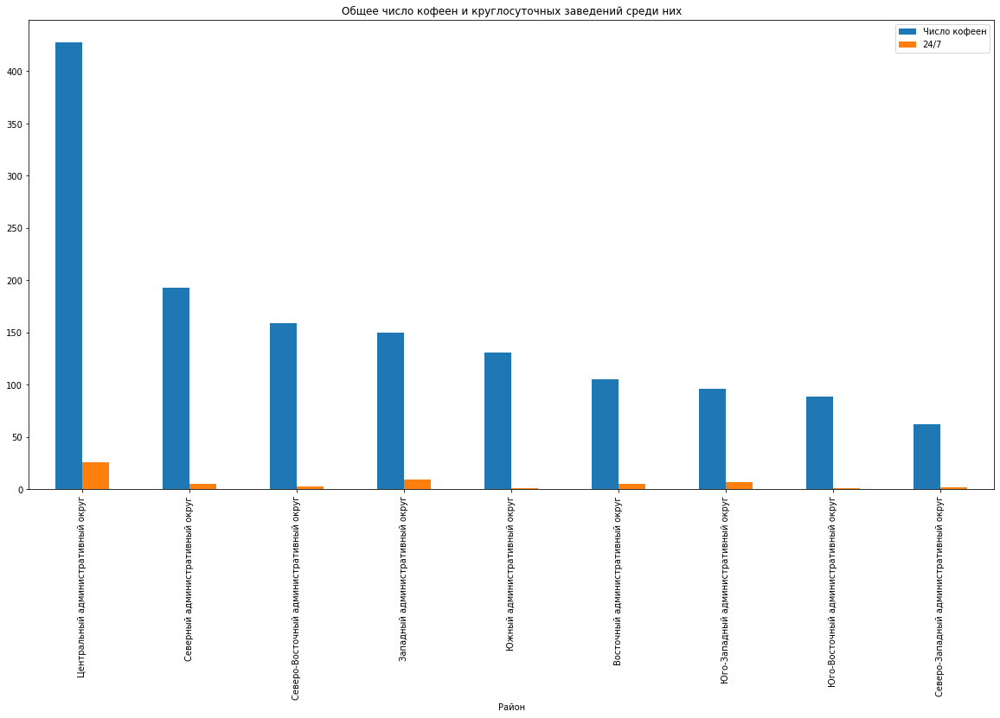

In [70]:
coffee_house_final.plot.bar(x='Район', y=['Число кофеен', '24/7'], figsize = (20, 10), title = 'Общее число кофеен и круглосуточных заведений среди них');

In [71]:
fig = px.line(coffee_house_final, x='Район', y='Рейтинг', title='Средний рейтинг кофеен по районам')
fig.update_xaxes(tickangle = 45)
fig.update_layout(template='simple_white')
fig.show()

In [72]:
fig = px.line(coffee_house_final, x='Район', y='Медианная цена чашки капучино', title='Медианная цена чашки капучино по районам')
fig.update_xaxes(tickangle = 45)
fig.update_layout(template='simple_white')
fig.show()

Диаграммы показывают нам несколько интересных деталей:
1. Самый высокий рейтинг у кофеен Центрального округа, но стоимость чашки кофе уступает округу Юго-Западному. Вероятно, это связано с тем, что и конкуренция в центре самая высокая - свыше 400 заведений данного типа.
2. А самый низкий рейтинг идет в паре с третьей по выстоте стоимостью - в Западном округе.
3. Внимание привлекает Северо-Запад: при минимальном числе кофеен стоимость чашки капучино почти в полтора раза ниже ЦАО и ЗАО, а рейтинг лишь одну сотую долю уступает Центральному округу.

Инвесторам стоит обратить внимание именно на этот третий пункт наших наблюдений. Небольшое число кофеен поможет еще более выделиться яркой концепции, а умеренная ценовая категория поможет поддержать идею доступности.

## Выводы

1. Самая многочисленная категория заведений — кафе, почти 2400 единиц, а самая малочисленная — булочные, чуть более 250. Интересующая нас категория кофеен на третьем месте с 1413 заведениями.
2. Самое большое медианное число посадочных мест - в ресторане (86), самое маленькое — в булочных (50). Обращает на себя внимание эта последняя цифра, так как в булочной — магазине хлебобулочных изделий — логично было бы ожидать всего 2-3 столика по 2-3 места. Более пристальное рассмотрение медианного числа посадочных местна примере булочных наводит на мысль, что большое число посадочных мест свойственно тем заведениям, которые расположены в крупных торговых центрах или вблизи рынков, и рассчитывается оно не по числу столиков, а по некому параметру, похожему на проходимость или посещаемость.
3. Сетевых заведений примерно в полтора раза меньше, чем несетевых.
4. Самая многочисленная категория с точки зрения принадлежности к сети — кафе (приблизительно 780), самая малочисленная — столовые (приблизительно 90). Кофейни снова замыкают тройку лидеров — 720 заведений этой категории относятся к сетям.
5. С большим отрывом в топе пятнадцати самых популярных сетей лидирует "Шоколадница". Замыкает рейтинг ее коллега по категории "Кофемания". На медиане расположен "КОФЕПОРТ", а его ближайшие соседи - "Кулинарная лавка братьев Караваевых" и "Prime". Самая многочисленная категория в рейтинге топ-15 - кофейня, их 350, и почти треть - в Центральном округе. Меньше всего булочных - 25, и все они относятся к сети "Буханка". Всего в рейтинг вошли заведения пяти категорий: кофейня, ресторан, пиццерия, кафе, булочная, из них кофейня самая многочисленная (45,4% всех заведений в топ-15). 
6. В каждом районе присутствуют заведения всех категорий.
7. Самый высокий средний рейтинг у баров / пабов, самый низкий — у категории быстрого питания. Однако диапазон колебаний не слишком большой, всего 0,4 балла.
8. Самый высокий средний рейтинг у заведений Центрального округа (4,37), а самый низкий — в Юго-Восточном округе (4,10).
9. Топ-15 улиц по количеству заведений открывает проспект Мира (184), а замыкает Пятницкая улица. Медианное число заведений — 76, а всего их на этих 15 улицах — 1258. С точки зрения распределения категорий по топ-15 улиц, не везде присутствует полный набор категорий, например, на Кольцевой дороге нет пиццерий и булочных, а на Пятницкой - столовых.
10. Всего в датасете 455 случаев, когда на данной улице расположено всего одно заведение общественного питания. В этой выборке встречаются заведения всех категорий. Средний рейтинг заведений - 4,3 балла. 31 из них работает круглосуточно. Затруднительно сказать, если у этих заведений есть нечто общее.
11. Диапазон медианы среднего чека находится в пределах от 450 до 1000 рублей. Нет прямой зависимости между удаленностью от центра города и медианой среднего чека.
12. Прицельный взгляд на кофейни выявляет несколько интересных деталей:
- Самый высокий рейтинг у кофеен Центрального округа, но стоимость чашки кофе уступает округу Юго-Западному. Вероятно, это связано с тем, что и конкуренция в центре самая высокая - свыше 400 заведений данного типа.
- А самый низкий рейтинг идет в паре с третьей по выстоте стоимостью - в Западном округе.
- Внимание привлекает Северо-Запад: при минимальном числе кофеен стоимость чашки капучино почти в полтора раза ниже ЦАО и ЗАО, а рейтинг лишь одну сотую долю уступает Центральному округу.

**Инвесторам стоит обратить внимание именно на этот последний пункт наших наблюдений. Небольшое число кофеен поможет еще более выделиться яркой концепции, а умеренная ценовая категория поможет поддержать идею доступности.**